# Importing Packages

In [1]:
import pandas as pd 
import numpy as np
from typing import List, Union
from matplotlib import pyplot as plt
import matplotlib.colors as mcolors
from pandas.plotting import parallel_coordinates
import seaborn as sns

from rdkit import Chem
from rdkit.Chem import MolFromSmiles, Descriptors, AddHs, AllChem
from rdkit.ML.Descriptors import MoleculeDescriptors

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from umap import UMAP 
from hdbscan import HDBSCAN
from collections import Counter

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import numpy as np
from tqdm.notebook import tqdm

# from viral_protein import esm_collate
from utils.preprocessing import protein_ligand_Dataset
from ligand_target import get_tokenized_morgan_fp, get_morgan_fp
from sklearn.preprocessing import OneHotEncoder

from transformers import AutoTokenizer, EsmForSequenceClassification, EsmConfig, EsmModel
from transformers.models.esm.modeling_esm import EsmEncoder, EsmEmbeddings, EsmPooler

from transformers.modeling_outputs import SequenceClassifierOutput
from transformers.modeling_utils import ModuleUtilsMixin
from torch.nn import BCEWithLogitsLoss, CrossEntropyLoss, MSELoss, BCELoss

Some weights of EsmForSequenceClassification were not initialized from the model checkpoint at facebook/esm2_t12_35M_UR50D and are newly initialized: ['classifier.out_proj.bias', 'classifier.out_proj.weight', 'classifier.dense.bias', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
tokenizer = AutoTokenizer.from_pretrained("facebook/esm2_t6_8M_UR50D")
device = "cuda" if torch.cuda.is_available() else "cpu"
device

# Defining Utility Functions & Classes

## RDKit descriptors & K-means

In [8]:
#using code from https://github.com/gashawmg for featurisation of ligand SMILES
def RDkit_descriptors(smiles:List[str]):
    mols = [MolFromSmiles(i) for i in smiles]
    calc = MoleculeDescriptors.MolecularDescriptorCalculator([x[0] for x in Descriptors._descList])
    desc_names = calc.GetDescriptorNames()

    Mol_descriptors = []
    for mol in tqdm(mols):
        mol=AddHs(mol) #adding hydrogens
        descriptors = calc.CalcDescriptors(mol) #calculate all RDkit descriptors (~200) for each molecule
        Mol_descriptors.append(descriptors)
    return Mol_descriptors, desc_names

In [ ]:
#some definitions for further cluster visualisation using code from https://github.com/OpenClassrooms-Student-Center/
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    '''Display a scatter plot on a factorial plane, one for each factorial plane'''

    # For each factorial plane
    for d1,d2 in axis_ranks:
        if d2 < n_comp:

            # Initialise the matplotlib figure
            fig = plt.figure(figsize=(7,6))

            # Display the points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # Display the labels on the points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center')

            # Define the limits of the chart
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])

            # Display grid lines
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # Label the axes, with the percentage of variance explained
            plt.xlabel('PC{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('PC{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection of points (on PC{} and PC{})".format(d1+1, d2+1))
            #plt.show(block=False)

palette = sns.color_palette("bright", 10)
def addAlpha(colour, alpha):
    '''Add an alpha to the RGB colour'''

    return (colour[0],colour[1],colour[2],alpha)
def display_parallel_coordinates(df, num_clusters):
    '''Display a parallel coordinates plot for the clusters in df'''

    # Select data points for individual clusters
    cluster_points = []
    for i in range(num_clusters):
        cluster_points.append(df[df.cluster==i])

    # Create the plot
    fig = plt.figure(figsize=(12, 15))
    title = fig.suptitle("Parallel Coordinates Plot for the Clusters", fontsize=18)
    fig.subplots_adjust(top=0.95, wspace=0)

    # Display one plot for each cluster, with the lines for the main cluster appearing over the lines for the other clusters
    for i in range(num_clusters):
        plt.subplot(num_clusters, 1, i+1)
        for j,c in enumerate(cluster_points):
            if i!= j:
                pc = parallel_coordinates(c, 'cluster', color=[addAlpha(palette[j],0.2)])
        pc = parallel_coordinates(cluster_points[i], 'cluster', color=[addAlpha(palette[i],0.5)])

        # Stagger the axes
        ax=plt.gca()
        for tick in ax.xaxis.get_major_ticks()[1::2]:
            tick.set_pad(20)


def display_parallel_coordinates_centroids(df, num_clusters):
    '''Display a parallel coordinates plot for the centroids in df'''

    # Create the plot
    fig = plt.figure(figsize=(12, 5))
    title = fig.suptitle("Parallel Coordinates plot for the Centroids", fontsize=18)
    fig.subplots_adjust(top=0.9, wspace=0)

    # Draw the chart
    parallel_coordinates(df, 'cluster', color=palette)

    # Stagger the axes
    ax=plt.gca()
    for tick in ax.xaxis.get_major_ticks()[1::2]:
        tick.set_pad(20)

## Morgan Fingerprints & UMAP

In [14]:
fp = pd.read_csv('morgan_fingerprints.csv') # file that Nan helpfully generated for us
fp_dict = {k:v for k,v in zip(fp['SMILES'], fp.iloc[:,2:].values)}

def get_morgan_fp(SMILES:Union[str, List[str]], as_tensor=False):
    if isinstance(SMILES, str):
        SMILES = [SMILES]
    
    output = np.zeros((len(SMILES), 2048))
    for idx, ligand in enumerate(SMILES):
        try:
            morgan_fp = fp_dict[ligand]
        except:
            mol = MolFromSmiles(ligand)
            morgan_fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius = 3, nBits = 2048) # type: ignore
            morgan_fp = np.asarray(morgan_fp)

        output[idx,:] = morgan_fp
    if as_tensor:
        return torch.Tensor(output).type(torch.IntTensor) # type: ignore
    else:
        return output

## Model based on features from both protein and ligands

In [ ]:
class protein_ligand_Dataset(Dataset):
    def __init__(self, ligandSMILES, proteinSeq, label, label_type='classification'):
        self.ligandSMILES = ligandSMILES
        self.proteinSeq = proteinSeq

        if label is not None and label_type=='multi_class':
            encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
            self.label = encoder.fit_transform(label.reshape(-1, 1))
        
        elif label is not None:
            self.label = label

    def __len__(self):
        return len(self.ligandSMILES)

    def __getitem__(self, idx):
        ligand = self.ligandSMILES[idx]
        protein = self.proteinSeq[idx]
        label = self.label[idx]
        return ligand, protein, label

In [ ]:
def ligand_target_collate(sample):
    # print(sample)
    ligand = [x[0] for x in sample]
    protein = [x[1] for x in sample]
    label = torch.Tensor(np.array([x[2] for x in sample])).type(torch.float32)
    
    protein_inputs = tokenizer(protein, return_tensors="pt", padding='max_length', max_length=1001)
    ligand_fp = get_morgan_fp(ligand, as_tensor=True).type(torch.float32)
    
    return ligand_fp, protein_inputs, label

In [ ]:
def count_parameters(model):
        return sum(p.numel() for p in model.parameters() if p.requires_grad)

def get_extended_attention_mask2(
       attention_mask: torch.Tensor, dtype=torch.float32 # type: ignore
    ) -> torch.Tensor:
    if attention_mask.dim() == 3:
        extended_attention_mask = attention_mask[:, None, :, :]
    elif attention_mask.dim() == 2:
        # Provided a padding mask of dimensions [batch_size, seq_length]
        # - if the model is a decoder, apply a causal mask in addition to the padding mask
        # - if the model is an encoder, make the mask broadcastable to [batch_size, num_heads, seq_length, seq_length]
        extended_attention_mask = attention_mask[:, None, None, :]
    else:
        raise ValueError(
            f"Wrong shape for input_ids or attention_mask (shape {attention_mask.shape})"
        )

    # Since attention_mask is 1.0 for positions we want to attend and 0.0 for
    # masked positions, this operation will create a tensor which is 0.0 for
    # positions we want to attend and the dtype's smallest value for masked positions.
    # Since we are adding it to the raw scores before the softmax, this is
    # effectively the same as removing these entirely.
    extended_attention_mask = extended_attention_mask.to(dtype=dtype)  # fp16 compatibility
    extended_attention_mask = (1.0 - extended_attention_mask) * torch.finfo(dtype).min
    return extended_attention_mask

In [ ]:
class ligand_targetESM_v3_simple(nn.Module):
    def __init__(self, config:EsmConfig, esm_model:EsmForSequenceClassification):
        super().__init__()
        self.config = config
        self.esmEmbeddings = esm_model.esm.embeddings
        # self.esmEmbeddings.word_embeddings.weight.requires_grad = False

        self.esmEncoder = esm_model.esm.encoder
        self.num_labels = config.num_labels
        self.pooler = EsmPooler(config)
        
        self.ligand_fp = nn.Linear(2048, 2048)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(config.hidden_dropout_prob)
        self.ligand_out = nn.Linear(2048, config.hidden_size)
        
        self.ligand_target = nn.Linear(config.hidden_size*2, config.hidden_size)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(config.hidden_dropout_prob)
        # self.

        # self.esm
        # self.head = esm_model.esm.contact_head
        self.classifier = nn.Linear(config.hidden_size, config.num_labels)
        self.sigmoid = nn.Sigmoid()
             
    
    def forward(self, input, input_mask, ligand_fp, labels):
        emb = self.esmEmbeddings(input, attention_mask=input_mask)
        extended_mask = get_extended_attention_mask2(input_mask)
        encoder_outputs = self.esmEncoder(emb, attention_mask=extended_mask)[0]
        encoder_outputs = encoder_outputs[:, 0, :]
        # encoder_outputs = self.pooler(encoder_outputs)
        # sequence_output = encoder_outputs[self.config.num_hidden_layers-1]

        lig = self.ligand_fp(ligand_fp)
        lig = self.relu1(lig)
        lig = self.dropout1(lig)
        lig = self.ligand_out(lig)
        # print(lig.shape, encoder_outputs.shape)

        ligand_target_cat = torch.cat((lig, encoder_outputs), dim=1) 
        ligand_target_cat = self.ligand_target(ligand_target_cat)
        ligand_target_cat = self.relu2(ligand_target_cat)
        ligand_target_cat = self.dropout2(ligand_target_cat)
        logits = self.classifier(ligand_target_cat)
        logits = self.sigmoid(logits)

        if self.config.problem_type == "regression":
                loss_fct = MSELoss()
                if self.num_labels == 1:
                    loss = loss_fct(logits.squeeze(), labels.squeeze())
                else:
                    loss = loss_fct(logits, labels)
        elif self.config.problem_type == "single_label_classification":
            loss_fct = BCELoss()
            loss = loss_fct(logits, labels)
        elif self.config.problem_type == "multi_label_classification":
            loss_fct = BCEWithLogitsLoss()
            loss = loss_fct(logits, labels)
        
        return SequenceClassifierOutput(
            loss=loss,
            logits=logits,
        )

# Pre-processing

Data Cleaning for IC50 values:
- remove rows with null IC50 values
- some rows have '>' or '<' sign in their IC50 value, take only the numeric values and if it has '<' sign then subtract by 0.5 (i.e '<2' -> 1.5).
- convert the data type to float
- add a classification column 'is_IC50_below_10_nM' and 'is_IC50_below_100_nM' for later task

In [7]:
organism = 'Target Source Organism According to Curator or DataSource'
chain = 'BindingDB Target Chain Sequence'
multichain = 'Number of Protein Chains in Target (>1 implies a multichain complex)'
cols = [organism, chain, multichain, 'Target Name', 'IC50 (nM)', 'Ligand SMILES', 'BindingDB Ligand Name', 'Ligand InChI Key']


path = r'BindingDB_BindingDB_Articles_202310.tsv'
df = pd.read_csv(path, delimiter='\t', usecols=range(50))
# length_filter = df[chain].str.len() <= 1000                 # remove very long protein sequence
# df = df[~df['IC50 (nM)'].isna() & length_filter][cols].drop_duplicates().reset_index(drop=True)

df = df[~df['IC50 (nM)'].isna()][cols].drop_duplicates().reset_index(drop=True)
df = df.reset_index(drop=True)
df['is_viral_protein'] = df[organism].str.lower().str.contains('virus')

df['IC50 (nM)'] = df['IC50 (nM)'].str.strip()

df['IC50_nM_cleaned'] = df['IC50 (nM)'].str.replace('[><]','', regex=True).astype(float)
df.loc[df['IC50 (nM)'].str.contains('<'), 'IC50_nM_cleaned'] = df[df['IC50 (nM)'].str.contains('<')]['IC50_nM_cleaned'] - 0.5

df['is_IC50_below_10_nM'] = df['IC50_nM_cleaned'] < 10
df['is_IC50_below_100_nM'] = df['IC50_nM_cleaned'] < 100

# df['Ki_nM_cleaned'] = df['Ki (nM)'].str.replace('[><]','', regex=True).astype(float)
# df.loc[df['Ki (nM)'].fillna('').str.contains('>'), 'Ki_nM_cleaned'] = df[df['Ki (nM)'].fillna('').str.contains('>')]['Ki_nM_cleaned'] - 0.5
df.to_csv('BindingDB_ligand_target_IC50_cleaned.csv', index=False)
df.head()

C:\Users\mdhya\AppData\Local\Temp\ipykernel_9456\3353664618.py:8: DtypeWarning: Columns (10,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path, delimiter='\t', usecols=range(50))


,Target Source Organism According to Curator or DataSource,BindingDB Target Chain Sequence,Number of Protein Chains in Target (>1 implies a multichain complex),Target Name,IC50 (nM),Ligand SMILES,BindingDB Ligand Name,Ligand InChI Key,is_viral_protein,IC50_nM_cleaned,is_IC50_below_10_nM,is_IC50_below_100_nM
0,NaN,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,1,Proto-oncogene tyrosine-protein kinase Src,8.7,COc1cc2c(Nc3ccc(Cl)cc3Cl)c(cnc2cc1OCCCN1CCN(C)...,3-quinolinecarbonitrile 3::4-Phenylamino-3-qui...,MVQUQGLRQPMJPU-UHFFFAOYSA-N,NaN,8.7,True,True
1,NaN,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,1,Proto-oncogene tyrosine-protein kinase Src,5.1,COc1cc2c(Nc3cc(OC)c(OC)c(OC)c3)c(cnc2cc1OCCCN1...,3-quinolinecarbonitrile 4::6-methoxy-7-[3-(4-m...,VOUVVBUKNLBXGS-UHFFFAOYSA-N,NaN,5.1,True,True
2,NaN,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,1,Proto-oncogene tyrosine-protein kinase Src,2.8,COCCOc1cc2ncc(C#N)c(Nc3cc(OC)c(Cl)cc3Cl)c2cc1O...,"3-quinolinecarbonitrile 8::4-[(2,4-dichloro-5-...",VXEOIAFZWQMOEP-UHFFFAOYSA-N,NaN,2.8,True,True
3,NaN,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,1,Proto-oncogene tyrosine-protein kinase Src,12,COCCOc1cc2ncc(C#N)c(Nc3ccc(Cl)cc3Cl)c2cc1OCCOC,"3-quinolinecarbonitrile 9::4-[(2,4-dichlorophe...",DTLASHUZTAPRBX-UHFFFAOYSA-N,NaN,12.0,False,True
4,NaN,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,1,Proto-oncogene tyrosine-protein kinase Src,25,COCCOc1cc2ncc(C#N)c(Nc3cc(OC)c(OC)c(OC)c3)c2cc...,"3-quinolinecarbonitrile 10::6,7-bis(2-methoxye...",BTBPPLGKNLXRGR-UHFFFAOYSA-N,NaN,25.0,False,True


# Exploratory Data Analysis (EDA)

## Distribution of IC50 values

In [ ]:
print('percentage of ligand-target pairs with IC50 < 1 nM', (df['IC50_nM_cleaned']<1).sum()/df.shape[0]*100)
print('percentage of ligand-target pairs with IC50 < 10 nM', (df['IC50_nM_cleaned']<10).sum()/df.shape[0]*100)
print('percentage of ligand-target pairs with IC50 < 100 nM', (df['IC50_nM_cleaned']<100).sum()/df.shape[0]*100)
print('percentage of ligand-target pairs with IC50 >= 1e5 nM', (df['IC50_nM_cleaned']>=1e5).sum()/df.shape[0]*100)

# see histogram, remove the long tail (IC50 >=1e5 nM) for better visibility
df[df.IC50_nM_cleaned<=1e5]['IC50_nM_cleaned'].hist()

## Investigating Ligands Chemical Space via RDKit descriptors

### Generate dataframe of RDKit descriptors from ligand SMILES

In [ ]:
ligandsDF = df[['Ligand SMILES']].drop_duplicates().reset_index(drop=True)
lowmidhighIC50Mol_descriptors, lowmidhighIC50desc_names = RDkit_descriptors(ligandsDF['Ligand SMILES'].tolist())
lowmidhighIC50_RDkitdf = pd.DataFrame(lowmidhighIC50Mol_descriptors,columns=lowmidhighIC50desc_names)
lowmidhighIC50_RDkitdf.head()

In [ ]:
#taking into account eight features
IC50columns = ['ExactMolWt','TPSA','HeavyAtomCount','NumAromaticRings','NumHDonors','NumHAcceptors','MolLogP', 'qed']
#making RDkit subset dataframes corresponding to only 8/210 features
lowmidhighIC50_RDkitdf = lowmidhighIC50_RDkitdf[IC50columns]

### K-means Clustering

In [ ]:
# scale values before PCA
X_lowmidhighIC50subset_scaled = StandardScaler().fit_transform(lowmidhighIC50_RDkitdf.values)

# reduce dimension with PCA
X_lowmidhighIC50subset_pca = PCA(n_components = 2).fit_transform(X_lowmidhighIC50subset_scaled)
print('PCA components\' explained variance', X_lowmidhighIC50subset_pca.explained_variance_)

In [ ]:
#checking for ideal value of k using elbow method
range_of_ks = range(1,10)
kmeans_per_k = [KMeans(n_clusters = k, n_init = 'auto').fit(X_lowmidhighIC50subset_pca) for k in range_of_ks]

inertias = [model.inertia_ for model in kmeans_per_k]

plt.figure(figsize = (8,4))
plt.plot(range_of_ks, inertias, 'bo-')
plt.title('Low, mid and high IC50 values subset')
plt.xlabel('$k$',fontsize=14)
plt.ylabel('Inertia', fontsize=14)
plt.show()

In [ ]:
#checking for ideal value of k using silhoutte score method
silhouette_scores = [silhouette_score(X_lowmidhighIC50subset_pca, model.labels_)
                     for model in kmeans_per_k[1:]]
plt.figure(figsize=(8,4))
plt.plot(range_of_ks[1:],silhouette_scores,'bo-')
plt.title('Low, mid and high IC50 values subset')
plt.xlabel('$k$',fontsize=14)
plt.ylabel('Silhouette score',fontsize=14)
plt.show()

In [ ]:
num_clusters = 5 #based on elbow and silhoutte scores
kmeans = KMeans(n_clusters=num_clusters, init ='k-means++', random_state=42) #initialising the model
kmeans.fit(X_lowmidhighIC50subset_scaled) #fitting the model to my scaled data

y_pred = kmeans.predict(X_lowmidhighIC50subset_scaled) #obtaining y predictions based on scaled concatenated dataset
print('len(y_pred) =', len(y_pred))

cluster_labels = kmeans.labels_ #getting the cluster labels for each data point
clustered_data = np.column_stack((X_lowmidhighIC50subset_scaled, cluster_labels))
print('len(clustered_data) =', len(clustered_data))#displaying the clustered data

#determining the number of ligands within each cluster
frame = pd.DataFrame(X_lowmidhighIC50subset_scaled)
frame['cluster'] = y_pred
frame['cluster'].value_counts()

In [ ]:
#a simple visualisation of the clusters
plt.scatter(X_lowmidhighIC50subset_scaled[:,0], X_lowmidhighIC50subset_scaled[:,1], c=cluster_labels, cmap='viridis')
plt.title('K-Means Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

In [ ]:
#isualisation of clusters after performing pca
pca = PCA(n_components = 2)
X_lowmidhighIC50subset_pca = pca.fit_transform(X_lowmidhighIC50subset_scaled)
print('PCA components\' explained variance', X_lowmidhighIC50subset_pca.explained_variance_)

centres_reduced = pca.transform(kmeans.cluster_centers_)
display_factorial_planes(X_lowmidhighIC50subset_pca, 2, pca, [(0,1)], illustrative_var = y_pred, alpha = 0.8)
plt.scatter(centres_reduced[:, 0], centres_reduced[:, 1],
            marker='x', s=169, linewidths=3,
            color='k', zorder=10)

In [ ]:
#creating dataframe which shows which ligands are within each cluster specifically
featurised = pd.concat([ligandsDF, lowmidhighIC50_RDkitdf],axis=1)
featurised = featurised.set_index('Ligand SMILES')

#for visualisation of distribution of important features within each cluster
centroids = pd.DataFrame(kmeans.cluster_centers_, columns=featurised.columns)
centroids['cluster'] = centroids.index

display_parallel_coordinates_centroids(centroids, 5)

# Viral Proteins Ligand Chemical Space via Morgan Fingerprint

In [ ]:
# read from csv file of the pre-processed dataframe
## df = pd.read_csv('BindingDB_ligand_target_IC50_cleaned.csv') 

# generate dataframe that only contains Viral Targets
virusDF = df[df.is_viral_protein==1]
virusDF_ligands = virusDF['Ligand SMILES'].unique()
len(virusDF_ligands)

In [ ]:
# get numpy array of ligands' morgan fingerprints
morgan_fps = get_morgan_fp(virusDF_ligands)

# initialize UMAP and run it
umap_red = UMAP(n_neighbors=100, n_components=2)
morgan_fps_umap2 = umap_red.fit_transform(morgan_fps)

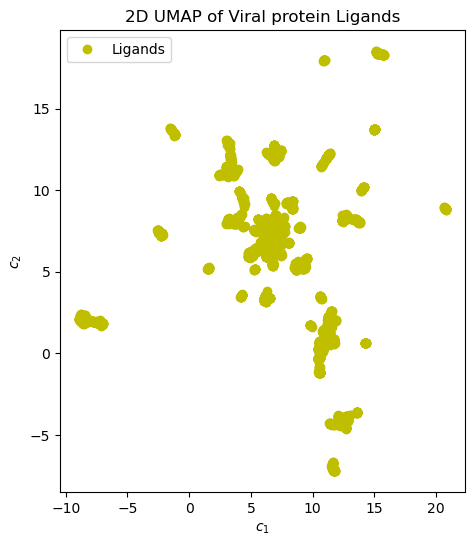

In [ ]:
## visualizing the chemical space of ligands targeting viral protein in BindingDB dataset
plt.figure(figsize = (12, 6))

plt.subplot(122)
plt.plot(morgan_fps_umap2[:, 0], morgan_fps_umap2[:, 1], 'yo', label = 'Ligands')
# plt.plot(X_95[:, 0][y_wine == 1], X_95[:, 1][y_wine == 1], 'bs', label = 'Cultivar 2')
# plt.plot(X_95[:, 0][y_wine == 2], X_95[:, 1][y_wine == 2], 'g^', label = 'Cultivar 3')
plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.title('2D UMAP of Viral protein Ligands')
plt.xlabel('$c_1$')
plt.ylabel('$c_2$')

plt.subplots_adjust(wspace = 0.3)
plt.savefig('UMAP_before_clustering.png')
plt.show()

## Clustering to try quantifying the diversity of chemical space

In [ ]:
# cluster with HDBSCAN, the number of clusters that were found signify the diversity of the chemical space
clustering_algo = HDBSCAN(cluster_selection_epsilon=1)
clusters = clustering_algo.fit_predict(morgan_fps_umap2) 

cluster_stats = Counter(clusters)

C:\Users\mdhya\AppData\Local\Temp\ipykernel_19396\1279395560.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "yo" (-> color='y'). The keyword argument will take precedence.
  plt.plot(morgan_fps_umap2[:, 0][clusters==cluster_num], morgan_fps_umap2[:, 1][clusters==cluster_num], 'yo', c=color_set[cluster_num], label = str(cluster_num))


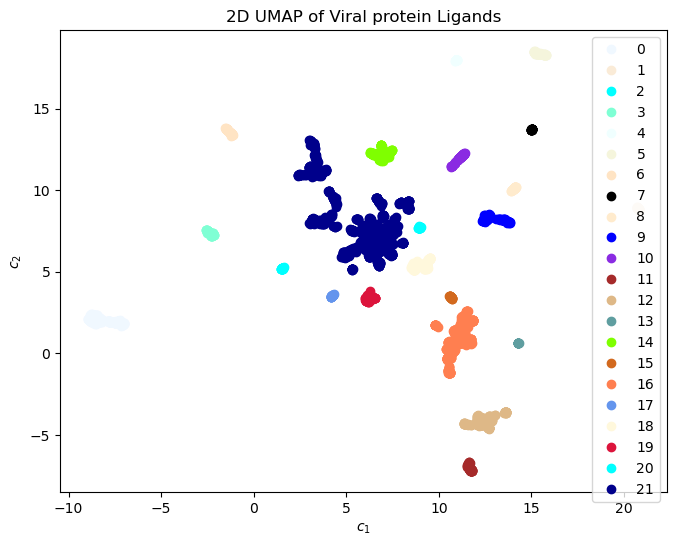

In [ ]:
color_set = [x for x in mcolors.CSS4_COLORS.keys()]
plt.figure(figsize = (18, 6))

plt.subplot(122)
for cluster_num in range(max(clusters)+1):
    plt.plot(morgan_fps_umap2[:, 0][clusters==cluster_num], morgan_fps_umap2[:, 1][clusters==cluster_num], 'yo', c=color_set[cluster_num], label = str(cluster_num))

plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.title('2D UMAP of Viral protein Ligands')
plt.xlabel('$c_1$')
plt.ylabel('$c_2$')

plt.subplots_adjust(wspace = 0.3)
plt.savefig('UMAP_after_clustering.png')
plt.show()

21 clusters found

# All Proteins Ligand Chemical Space via Morgan Fingerprint

In [ ]:
morgan_fp = pd.read_csv('morgan_fingerprints.csv')
morgan_fp = morgan_fp.rename(columns={'SMILES':'Ligand SMILES'})
morgan_fp = morgan_fp.iloc[:,1:]
morgan_fp

In [ ]:
ligandDF = df[['Ligand SMILES', 'is_viral_protein']].sort_values('is_viral_protein', ascending=False).drop_duplicates().reset_index(drop=True)
ligandDF['is_viral_protein_str'] = ligandDF['is_viral_protein'].astype(str)
ligandDF = ligandDF.groupby('Ligand SMILES')['is_viral_protein_str'].agg(list).reset_index()
ligandDF['is_viral_protein_str'] = ligandDF['is_viral_protein_str'].str.join('')
ligandDF['protein_target_class'] = 'Virus Target'
ligandDF.loc[ligandDF['is_viral_protein_str']=='0', 'protein_target_class'] = 'Non-virus Target'
ligandDF.loc[(ligandDF['is_viral_protein_str'].str.len()>1), 'protein_target_class'] = 'Virus & Non-virus Target'
ligandDF = ligandDF.merge(morgan_fp, on='Ligand SMILES').reset_index(drop=True)
ligandDF

,Ligand SMILES,is_viral_protein_str,protein_target_class,0,1,2,3,4,5,6,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,BrC1=CCCCC1=O,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,BrCC(=O)NCC(=O)N1CCN(CC1)C(=O)C12CC3CC(CC(C3)C...,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,BrCC(=O)NCC(=O)N1CCN(CC1)C(=O)OCC12CC3CC(CC(C3...,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,BrCC(=O)NCC(=O)N1CCN(CC1)C(=O)OCCC12CC3CC(CC(C...,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,BrCC(=O)NCC(=O)N1CCN(CC1)C(=O)OCc1ccc2ccccc2c1,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26966,c1nc2ccccc2n1-c1ccccc1,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26967,c1nc2ccccc2n1-c1ccncc1,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26968,c1nc2cccnc2n1-c1ccccc1,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26969,c1nc2cnccc2n1-c1ccccc1,0,Non-virus Target,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
umap_red = UMAP(n_neighbors=1000, n_components=2)
morgan_fp_umap2 = umap_red.fit_transform(ligandDF.iloc[:,3:])

In [ ]:
plt.figure(figsize = (6, 6))

plt.subplot(131)
plt.plot(morgan_fp_umap2[ligandDF.protein_target_class=='Virus Target'][:, 0], morgan_fp_umap2[ligandDF.protein_target_class=='Virus Target'][:, 1], 'ro', label = 'Virus Target')
plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.xlim(-15,20)
plt.ylim(-15,15)
plt.subplot(132)
plt.plot(morgan_fp_umap2[(ligandDF.protein_target_class=='Non-virus Target')][:, 0], morgan_fp_umap2[(ligandDF.protein_target_class=='Non-virus Target')][:, 1], 'bx', label = 'Non-virus Target')
plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.xlim(-15,20)
plt.ylim(-15,15)
plt.subplot(133)
plt.plot(morgan_fp_umap2[(ligandDF.protein_target_class=='Virus & Non-virus Target')][:, 0], morgan_fp_umap2[(ligandDF.protein_target_class=='Virus & Non-virus Target')][:, 1], 'yo', label = 'Both Targets')
plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.xlim(-15,20)
plt.ylim(-15,15)

plt.title('2D UMAP of All ligand Morgan Fingerprint')
plt.xlabel('$umap_1$')
plt.ylabel('$umap_2$')

plt.subplots_adjust(wspace = 0.3)
plt.savefig('all_ligand_morgan_fp__UMAP_before_clustering3_split.png')
plt.show()

In [ ]:
plt.figure(figsize = (6, 6))

# plt.subplot(221)
plt.plot(morgan_fp_umap2[ligandDF.protein_target_class=='Virus Target'][:, 0], morgan_fp_umap2[ligandDF.protein_target_class=='Virus Target'][:, 1], 'ro', label = 'Virus Target')
plt.plot(morgan_fp_umap2[(ligandDF.protein_target_class=='Non-virus Target')][:, 0], morgan_fp_umap2[(ligandDF.protein_target_class=='Non-virus Target')][:, 1], 'bx', label = 'Non-virus Target')
plt.plot(morgan_fp_umap2[(ligandDF.protein_target_class=='Virus & Non-virus Target')][:, 0], morgan_fp_umap2[(ligandDF.protein_target_class=='Virus & Non-virus Target')][:, 1], 'yo', label = 'Both Targets')
plt.legend(loc = 'upper right', shadow = False, scatterpoints = 1)
plt.xlim(-15,20)
plt.ylim(-15,15)

plt.title('2D UMAP of All ligand Morgan Fingerprint')
plt.xlabel('$umap_1$')
plt.ylabel('$umap_2$')

plt.subplots_adjust(wspace = 0.3)
plt.savefig('all_ligand_morgan_fp__UMAP_before_clustering3_combined.png')
plt.show()

# Model with ligand-based predictor for replicase polyprotein 1ab

## Load the dataset and create train-test split

In [2]:
df = pd.read_csv('BindingDB_ligand_target_IC50_cleaned.csv')
replicase = df['Target Name'].str.contains("Replicase polyprotein 1ab")
replicasedf = df[replicase].reset_index(drop=True)

replicasedf.is_IC50_below_100_nM.value_counts() 

False    3332
True      266
Name: is_IC50_below_100_nM, dtype: int64

In [3]:
replicasedf['BindingDB Target Chain Sequence'].str.len().describe()

count    3598.000000
mean     7035.044747
std       606.367344
min       306.000000
25%      7096.000000
50%      7096.000000
75%      7096.000000
max      7132.000000
Name: BindingDB Target Chain Sequence, dtype: float64

In [9]:
# get RDKit descriptors
replicasedf_rdkit_descriptors, replicasedf_rdkit_desc_names = RDkit_descriptors(replicasedf['Ligand SMILES'].tolist())
replicasedf_rdkit_descriptorsDF = pd.DataFrame(replicasedf_rdkit_descriptors,columns=replicasedf_rdkit_desc_names)
replicasedf_rdkit_descriptorsDF.head()

  0%|          | 0/3598 [00:00<?, ?it/s]

[23:42:06] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 42 in file C:\rdkit\build\temp.win-amd64-cpython-311\Release\rdkit\Code\GraphMol\Descriptors\Crippen.cpp
Failed Expression: logpContribs.size() == mol.getNumAtoms() && mrContribs.size() == mol.getNumAtoms()
****

[23:42:06] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 42 in file C:\rdkit\build\temp.win-amd64-cpython-311\Release\rdkit\Code\GraphMol\Descriptors\Crippen.cpp
Failed Expression: logpContribs.size() == mol.getNumAtoms() && mrContribs.size() == mol.getNumAtoms()
****

[23:42:06] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 42 in file C:\rdkit\build\temp.win-amd64-cpython-311\Release\rdkit\Code\GraphMol\Descriptors\Crippen.cpp
Failed Expression: logpContribs.size() == mol.getNumAtoms() && mrContribs.size() == mol.getNumAtoms()
****

[23:42:06] 

****
Pre-condition Violation
bad result vector size
Violation occurred o

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,SPS
0,14.281763,14.281763,0.477905,-4.590150,0.380282,23.484848,466.925,443.741,466.140783,170,...,0,0,0,0,0,0,0,0,0,23.484848
1,15.520714,15.520714,1.249686,-6.290436,0.178159,32.568182,632.158,589.822,631.277276,240,...,0,0,0,0,0,0,0,0,0,32.568182
2,15.455747,15.455747,0.305759,-6.062730,0.143771,29.295455,642.178,605.890,641.207483,234,...,0,0,0,0,0,0,1,0,0,29.295455
3,15.606160,15.606160,1.110658,-5.715344,0.086926,26.812500,675.142,639.862,674.225575,250,...,0,0,0,0,0,0,0,0,0,26.812500
4,15.585323,15.585323,0.253009,-5.656506,0.106766,26.489362,676.195,641.923,675.191832,244,...,0,0,0,0,0,0,1,0,0,26.489362


In [10]:
# get morgan fingerprints
morgan_fp = get_morgan_fp(replicasedf['Ligand SMILES'].tolist())
morgan_fp

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]])

In [11]:
replicasedf_clean = pd.concat([replicasedf, replicasedf_rdkit_descriptorsDF, pd.DataFrame(morgan_fp, columns=[f'Morgan_{i}' for i in range(2048)])], axis=1)
replicasedf_clean.head()

,Target Source Organism According to Curator or DataSource,BindingDB Target Chain Sequence,Number of Protein Chains in Target (>1 implies a multichain complex),Target Name,IC50 (nM),Ligand SMILES,BindingDB Ligand Name,Ligand InChI Key,is_viral_protein,IC50_nM_cleaned,...,Morgan_2038,Morgan_2039,Morgan_2040,Morgan_2041,Morgan_2042,Morgan_2043,Morgan_2044,Morgan_2045,Morgan_2046,Morgan_2047
0,Human SARS coronavirus,MESLVLGVNEKTHVQLSLPVLQVRDVLVRGFGDSVEEALSEAREHL...,1,Replicase polyprotein 1ab,60,CN(C)c1ccc(cc1)C(=O)N[C@@H](Cc1ccccc1)C(=O)Nc1...,(2S)-N-(2-chloro-4-nitrophenyl)-2-{[4-(dimethy...,NBBWJEWPUKPHPZ-QFIPXVFZSA-N,True,60.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Human SARS coronavirus,MESLVLGVNEKTHVQLSLPVLQVRDVLVRGFGDSVEEALSEAREHL...,1,Replicase polyprotein 1ab,>10000,CC(C)C[C@H](NC(=O)[C@@H](NC(=O)OC(C)(C)C)C(C)C...,Anilide Inhibitor 3d::tert-butyl N-[(1S)-1-{[(...,ONKANJYUPWHECL-GSDHBNRESA-N,True,10000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Human SARS coronavirus,MESLVLGVNEKTHVQLSLPVLQVRDVLVRGFGDSVEEALSEAREHL...,1,Replicase polyprotein 1ab,5000,CC(C)C[C@H](NC(=O)[C@@H](NC(=O)c1cccs1)C(C)C)C...,(2S)-N-[(1S)-1-[(2-chloro-4-nitrophenyl)carbam...,BOBHTKXBEGQHHJ-KLJDGLGGSA-N,True,5000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Human SARS coronavirus,MESLVLGVNEKTHVQLSLPVLQVRDVLVRGFGDSVEEALSEAREHL...,1,Replicase polyprotein 1ab,7000,CC(C)C(NC(=O)c1cc(C)[o+][n-]1)C(=O)NC(Cc1ccccc...,(2S)-N-[(1S)-1-{[(1S)-1-[(2-chloro-4-nitrophen...,SHBMVTFCFMSMCY-UHFFFAOYSA-N,True,7000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Human SARS coronavirus,MESLVLGVNEKTHVQLSLPVLQVRDVLVRGFGDSVEEALSEAREHL...,1,Replicase polyprotein 1ab,5000,CC(C)[C@H](NC(=O)c1cccs1)C(=O)N[C@@H](Cc1ccccc...,(2S)-N-[(1S)-1-{[(1S)-1-[(2-chloro-4-nitrophen...,NOUWGKBFWDKEIW-XEVVZDEMSA-N,True,5000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
#Assign IC50 as the Target
target_variable = 'is_IC50_below_100_nM'

# Extract 'MolWt' and 'qed' columns from features
# selected_features_morg = []
selected_features = ['qed', 'MolWt', 'TPSA']


# Add Morgan fingerprint columns
morgan_features = [f'Morgan_{i}' for i in range(2047)]

# Concatenate selected features and Morgan fingerprints
X_selected_morg = pd.concat([replicasedf_clean[selected_features], replicasedf_clean[morgan_features]], axis=1)

y_morg = replicasedf_clean[target_variable]

# Split the data into training and testing sets
X_train_selected_morg, X_test_selected_morg, y_train_morg, y_test_morg = train_test_split(X_selected_morg, y_morg, test_size=0.2, random_state=42)

In [32]:
y_test_morg.shape

(720,)

## RF Model using Morgan Fingerprints & selected RDKit descriptors as features

In [67]:
# train the model
# Create a RandomForestClassifier, set class_weight='balanced' because we have imbalanced dataset (3332 Negative vs. 266 Positive samples)
rf_class_morg = RandomForestClassifier(n_estimators=100, random_state=42, min_samples_leaf=4, max_depth=10, class_weight='balanced')

# Fit the model on the training data with selected features
rf_class_morg.fit(X_train_selected_morg, y_train_morg)

RandomForestClassifier(class_weight='balanced', max_depth=10,
                       min_samples_leaf=4, random_state=42)

In [68]:
# Performance on train set
train_pred = rf_class_morg.predict(X_train_selected_morg)
accuracy_morg = accuracy_score(y_train_morg, train_pred)
conf_matrix_morg = confusion_matrix(y_train_morg, train_pred)
class_report_morg = classification_report(y_train_morg, train_pred)

print('Train set performance')
print(f'Accuracy: {accuracy_morg}')
print(f'Confusion Matrix:\n{conf_matrix_morg}')
print(f'Classification Report:\n{class_report_morg}')

Train set performance
Accuracy: 0.9412786657400973
Confusion Matrix:
[[2535  133]
 [  36  174]]
Classification Report:
              precision    recall  f1-score   support

       False       0.99      0.95      0.97      2668
        True       0.57      0.83      0.67       210

    accuracy                           0.94      2878
   macro avg       0.78      0.89      0.82      2878
weighted avg       0.96      0.94      0.95      2878



In [69]:
# Performance on test set

# Make predictions on the test data with selected features
predictions_morg = rf_class_morg.predict(X_test_selected_morg)

# Evaluate the model
accuracy_morg = accuracy_score(y_test_morg, predictions_morg)
conf_matrix_morg = confusion_matrix(y_test_morg, predictions_morg)
class_report_morg = classification_report(y_test_morg, predictions_morg)

print('Test set performance')
print(f'Accuracy: {accuracy_morg}')
print(f'Confusion Matrix:\n{conf_matrix_morg}')
print(f'Classification Report:\n{class_report_morg}')

Test set performance
Accuracy: 0.9333333333333333
Confusion Matrix:
[[630  34]
 [ 14  42]]
Classification Report:
              precision    recall  f1-score   support

       False       0.98      0.95      0.96       664
        True       0.55      0.75      0.64        56

    accuracy                           0.93       720
   macro avg       0.77      0.85      0.80       720
weighted avg       0.95      0.93      0.94       720



looks like the model struggle to recall the positive case (cases where the ligand-target has strong binding)
one possible causes is the imbalance in the dataset (3332 Negative vs. 266 Positive samples) setting class_weight

### Feature Importance

In [57]:
# Get feature importances
feature_importances = rf_class_morg.feature_importances_

# Create a DataFrame with feature names and their importance scores
feature_importance_df = pd.DataFrame({
    'Feature': X_train_selected_morg.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
feature_importance_df.head(15)

,Feature,Importance
1875,Morgan_1872,0.025475
1614,Morgan_1611,0.024119
1354,Morgan_1351,0.018152
2,TPSA,0.016631
1037,Morgan_1034,0.016474
1464,Morgan_1461,0.014478
541,Morgan_538,0.013990
1095,Morgan_1092,0.013927
1051,Morgan_1048,0.013431
146,Morgan_143,0.013321


## Ablation Experiment: What if the selected RDKit descriptors are not used

In [39]:
y_morg = replicasedf_clean[target_variable]

# Split the data into training and testing sets
X_train_morg_only, X_test_morg_only, y_train_morg_only, y_test_morg_only = train_test_split(replicasedf_clean[morgan_features].values, y_morg, test_size=0.2, random_state=42)

In [50]:
# train the model
# Create a RandomForestClassifier, set class_weight='balanced' because we have imbalanced dataset (3332 Negative vs. 266 Positive samples)
rf_class_morg_only = RandomForestClassifier(n_estimators=100, random_state=42, min_samples_leaf=4, max_depth=10, class_weight='balanced')

# Fit the model on the training data with selected features
rf_class_morg_only.fit(X_train_morg_only, y_train_morg_only)

RandomForestClassifier(class_weight='balanced', max_depth=10,
                       min_samples_leaf=4, random_state=42)

In [51]:
# Performance on train set
train_pred = rf_class_morg_only.predict(X_train_morg_only)
accuracy_morg = accuracy_score(y_train_morg_only, train_pred)
conf_matrix_morg = confusion_matrix(y_train_morg_only, train_pred)
class_report_morg = classification_report(y_train_morg_only, train_pred)

print('Train set performance')
print(f'Accuracy: {accuracy_morg}')
print(f'Confusion Matrix:\n{conf_matrix_morg}')
print(f'Classification Report:\n{class_report_morg}')

Train set performance
Accuracy: 0.9391938846421126
Confusion Matrix:
[[2530  138]
 [  37  173]]
Classification Report:
              precision    recall  f1-score   support

       False       0.99      0.95      0.97      2668
        True       0.56      0.82      0.66       210

    accuracy                           0.94      2878
   macro avg       0.77      0.89      0.82      2878
weighted avg       0.95      0.94      0.94      2878



In [52]:
# Performance on test set

# Make predictions on the test data with selected features
predictions_morg = rf_class_morg_only.predict(X_test_morg_only)

# Evaluate the model
accuracy_morg = accuracy_score(y_test_morg_only, predictions_morg)
conf_matrix_morg = confusion_matrix(y_test_morg_only, predictions_morg)
class_report_morg = classification_report(y_test_morg_only, predictions_morg)

print('Test set performance')
print(f'Accuracy: {accuracy_morg}')
print(f'Confusion Matrix:\n{conf_matrix_morg}')
print(f'Classification Report:\n{class_report_morg}')

Test set performance
Accuracy: 0.9319444444444445
Confusion Matrix:
[[627  37]
 [ 12  44]]
Classification Report:
              precision    recall  f1-score   support

       False       0.98      0.94      0.96       664
        True       0.54      0.79      0.64        56

    accuracy                           0.93       720
   macro avg       0.76      0.86      0.80       720
weighted avg       0.95      0.93      0.94       720



## Ablation Experiment: What if the morgan fingerprint is not used

In [16]:
y_morg = replicasedf_clean[target_variable]

# Split the data into training and testing sets
X_train_no_morg, X_test_no_morg, y_train_no_morg, y_test_no_morg = train_test_split(replicasedf_clean[selected_features].values, y_morg, test_size=0.2, random_state=42)

In [36]:
# train the model
# Create a RandomForestClassifier, set class_weight='balanced' because we have imbalanced dataset (3332 Negative vs. 266 Positive samples)
rf_class_rdkit = RandomForestClassifier(n_estimators=100, random_state=42, min_samples_leaf=4, max_depth=10, class_weight='balanced')

# Fit the model on the training data with selected features
rf_class_rdkit.fit(X_train_no_morg, y_train_no_morg)

RandomForestClassifier(class_weight='balanced', max_depth=10,
                       min_samples_leaf=4, random_state=42)

In [37]:
# Performance on train set
train_pred = rf_class_rdkit.predict(X_train_no_morg)
accuracy_morg = accuracy_score(y_train_no_morg, train_pred)
conf_matrix_morg = confusion_matrix(y_train_no_morg, train_pred)
class_report_morg = classification_report(y_train_no_morg, train_pred)

print('Train set performance')
print(f'Accuracy: {accuracy_morg}')
print(f'Confusion Matrix:\n{conf_matrix_morg}')
print(f'Classification Report:\n{class_report_morg}')

Train set performance
Accuracy: 0.925642807505212
Confusion Matrix:
[[2473  195]
 [  19  191]]
Classification Report:
              precision    recall  f1-score   support

       False       0.99      0.93      0.96      2668
        True       0.49      0.91      0.64       210

    accuracy                           0.93      2878
   macro avg       0.74      0.92      0.80      2878
weighted avg       0.96      0.93      0.94      2878



In [38]:
# Performance on test set

# Make predictions on the test data with selected features
predictions_morg = rf_class_rdkit.predict(X_test_no_morg)

# Evaluate the model
accuracy_morg = accuracy_score(y_test_no_morg, predictions_morg)
conf_matrix_morg = confusion_matrix(y_test_no_morg, predictions_morg)
class_report_morg = classification_report(y_test_no_morg, predictions_morg)

print('Test set performance')
print(f'Accuracy: {accuracy_morg}')
print(f'Confusion Matrix:\n{conf_matrix_morg}')
print(f'Classification Report:\n{class_report_morg}')

Test set performance
Accuracy: 0.8902777777777777
Confusion Matrix:
[[603  61]
 [ 18  38]]
Classification Report:
              precision    recall  f1-score   support

       False       0.97      0.91      0.94       664
        True       0.38      0.68      0.49        56

    accuracy                           0.89       720
   macro avg       0.68      0.79      0.71       720
weighted avg       0.93      0.89      0.90       720



the model performance goes down quite a bit, 
on the test set the model with both morgan fingerprint and rdkit descriptors scored f1-score(macro avg) of 0.8
but if we only use the selected rdkit descriptors it becomes 0.71

# Using replicase polyprotein 1ab model to screen for potential new ligands

In [ ]:
nonviral_ligandDF = df[~df.is_viral_protein][['Ligand SMILES']].drop_duplicates().reset_index(drop=True)
morgan_fp = get_morgan_fp(df['Ligand SMILES'].tolist())

In [ ]:
rf_class_morg_only

# Expanding the scope to viral protein-ligand pairs
using both protein-based predictors and ligand-based predictor to predict if IC50 is < 100 nM

protein based predictor is generated using ESM-2, it's taken from a 2022 paper published on bioRxiv by Lin et al (https://doi.org/10.1101/2022.07.20.500902) and the code is open-sourced at https://github.com/facebookresearch/esm and also in huggingface (<a href='https://huggingface.co/docs/transformers/model_doc/esm'>huggingface docs<a>)


## Creating Loaders for train and test set

In [ ]:
chain = 'BindingDB Target Chain Sequence'

df = pd.read_csv('BindingDB_ligand_target_IC50_cleaned.csv')
df[chain] = df[chain].str.upper()

# filter to only data of viral protein with sequence of < 1000 amino acid (if there is multiple chain, we only look at the primary chain)
length_filter = df[chain].str.len() <= 1000  
virusdf = df[df.is_viral_protein.fillna(False) & length_filter]
virusdf.head()

we classify strong binding as ligand-target pairs with IC50 < 100 nM, otherwise it's weak binding

In [ ]:
# checking the ratio between positive (strong-binding) and negative sample
virusdf.is_IC50_below_100_nM.value_counts()

False    2705
True     1573
Name: is_IC50_below_100_nM, dtype: int64

In [ ]:
train_batch_size = 25
test_batch_size = 25

X_train, X_test, y_train, y_test = train_test_split(
                                                    np.arange(virusdf.shape[0]), 
                                                    virusdf['is_IC50_below_100_nM'].astype(float).values, 
                                                    stratify= virusdf['is_IC50_below_100_nM'].astype(float).values,
                                                    test_size=0.25, 
                                                    random_state=87,
                                                    shuffle=True)

train_dataset = protein_ligand_Dataset(virusdf['Ligand SMILES'].values[X_train], 
                                       virusdf[chain].values[X_train], 
                                       y_train)
train_loader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, collate_fn=ligand_target_collate)

test_dataset = protein_ligand_Dataset(virusdf['Ligand SMILES'].values[X_test], 
                                       virusdf[chain].values[X_test], 
                                       y_test)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size, collate_fn=ligand_target_collate)

In [ ]:
# check if the train_loader works well
# it's intended to output a tuple of (morgan fingerprints, tokenized amino acid sequence along with attention mask, and the label (is_IC50_below_100_nM column))
next(iter(train_loader))

(tensor([[0, 1, 0,  ..., 0, 0, 0],
         [0, 1, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 1],
         [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.int32),
 {'input_ids': tensor([[ 0, 14, 16,  ...,  1,  1,  1],
         [ 0, 14, 16,  ...,  1,  1,  1],
         [ 0, 14, 12,  ...,  1,  1,  1],
         ...,
         [ 0, 14, 12,  ...,  1,  1,  1],
         [ 0, 14, 12,  ...,  1,  1,  1],
         [ 0, 14, 12,  ...,  1,  1,  1]]), 'attention_mask': tensor([[1, 1, 1,  ..., 0, 0, 0],
         [1, 1, 1,  ..., 0, 0, 0],
         [1, 1, 1,  ..., 0, 0, 0],
         ...,
         [1, 1, 1,  ..., 0, 0, 0],
         [1, 1, 1,  ..., 0, 0, 0],
         [1, 1, 1,  ..., 0, 0, 0]])},
 tensor([1., 1., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1.,
         0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1.,
         0., 0., 0., 1., 0., 0., 1., 1., 1., 0., 0., 1., 0., 0.]))

## Define the DL model

the idea here is to use the output of ESM's encoder layer as descriptors for proteins, then concatenate them with morgan fingerprints from the ligand and put a number of dense layer after that to classify whether that viral protein-ligand pair has IC50 <100 nM or not

In [ ]:
config3 = EsmConfig(
    problem_type='single_label_classification',
    num_labels=1 ,
    hidden_size=320,
)

base_esm_model = EsmForSequenceClassification.from_pretrained("facebook/esm2_t6_8M_UR50D", num_labels=1)
model = ligand_targetESM_v3_simple(config=config3, esm_model=base_esm_model).to(device)
for name, param in model.named_parameters():
    if '.layer.' in name or  'embeddings' in name:
        param.requires_grad = False
model

In [ ]:
config3 = EsmConfig(
    problem_type='single_label_classification',
    num_labels=1 ,
    hidden_size=320,
)

base_esm_model = EsmForSequenceClassification.from_pretrained("facebook/esm2_t6_8M_UR50D", num_labels=1)
model = ligand_targetESM_v3_simple(config=config3, esm_model=base_esm_model).to(device)
for name, param in model.named_parameters():
    if '.layer.' in name or  'embeddings' in name:
        param.requires_grad = False
model

Some weights of EsmForSequenceClassification were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['classifier.out_proj.bias', 'classifier.out_proj.weight', 'classifier.dense.bias', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ligand_targetESM_v3_simple(
  (esmEmbeddings): EsmEmbeddings(
    (word_embeddings): Embedding(33, 320, padding_idx=1)
    (dropout): Dropout(p=0.0, inplace=False)
    (position_embeddings): Embedding(1026, 320, padding_idx=1)
  )
  (esmEncoder): EsmEncoder(
    (layer): ModuleList(
      (0-5): 6 x EsmLayer(
        (attention): EsmAttention(
          (self): EsmSelfAttention(
            (query): Linear(in_features=320, out_features=320, bias=True)
            (key): Linear(in_features=320, out_features=320, bias=True)
            (value): Linear(in_features=320, out_features=320, bias=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (rotary_embeddings): RotaryEmbedding()
          )
          (output): EsmSelfOutput(
            (dense): Linear(in_features=320, out_features=320, bias=True)
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (LayerNorm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
        )
        (intermediate

In [ ]:
# count number of trainable parameters
count_parameters(model)

5160833

In [ ]:
# get the number of parameters for each trainable layer
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name, param.numel())


esmEncoder.emb_layer_norm_after.weight 320
esmEncoder.emb_layer_norm_after.bias 320
pooler.dense.weight 102400
pooler.dense.bias 320
ligand_fp.weight 4194304
ligand_fp.bias 2048
ligand_out.weight 655360
ligand_out.bias 320
ligand_target.weight 204800
ligand_target.bias 320
classifier.weight 320
classifier.bias 1


## Train the model
note: it took around 3-4 hrs to train 10 epochs

In [ ]:
optim = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001)
model.train()
model.to(device)
epochs = 10     # train for 10 epochs


for epoch in range(epochs):
    total_loss = 0
    for ligand, protein_inputs, labels in tqdm(train_loader):
        optim.zero_grad()
        loss = model(
                protein_inputs['input_ids'].to(device), 
                protein_inputs['attention_mask'].to(device), 
                ligand.to(device),
                labels=labels.unsqueeze(dim=1).to(device)
            ).loss # type: ignore
        print('loss: ', loss)
        total_loss += loss.cpu()
        loss.backward()
        optim.step()

    print("Epoch: {} -> loss: {}".format(epoch+1, total_loss/(len(train_dataset))))

    # save the model to a .pt file after each epoch
    torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optim.state_dict(),
            'loss': total_loss/(len(train_loader)),
            }, 'esm2_viral_protein_ligand_IC50_100nM_classifier_v3_2.pt')

# Evaluate the model on test set

In [ ]:
model.eval()
batch = 25

with torch.no_grad():
    test_correct = 0
    total_loss = 0
    i = 0
    predictions = torch.empty((len(test_dataset), 1), dtype=torch.float32)  # type: ignore 
    logits = torch.empty((len(test_dataset), 1), dtype=torch.float32)  # type: ignore
    for ligand, protein_inputs, labels in tqdm(test_loader):
        batch_len = labels.shape[0]
        # input = batch.clone()
        # inputs = tokenizer(batch, return_tensors="pt", padding='max_length', max_length=1001)
        # print(inputs, labels)
        output = model(
            protein_inputs['input_ids'].to(device), 
            protein_inputs['attention_mask'].to(device), 
            ligand.to(device),
            labels=labels.unsqueeze(dim=1).to(device)
        ) # type: ignore
        # pred = torch.argmax(output.logits, dim=1)
        pred = torch.where(output.logits >= 0.5, 1, 0)
        predictions[i*batch:(i*batch)+batch_len] = pred
        logits[i*batch:(i*batch)+batch_len] = output.logits
        batch_correct = (pred.cpu() == labels.unsqueeze(dim=1)).float().sum()
        test_correct += batch_correct

        loss = output.loss
        total_loss += loss.cpu()
        
        i+=1
        # print('batch_acc: ', batch_correct/batch)


    accuracy = test_correct / len(test_dataset)
    out = {
        "loss":total_loss, 
        "accuracy":accuracy, 
        "predictions":predictions,
        "logits":logits
    }

In [ ]:
out

{'loss': tensor(18.2722),
 'accuracy': tensor(0.8467),
 'predictions': tensor([[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [1.],
         [0.]]),
 'logits': tensor([[2.3120e-02],
         [9.3420e-02],
         [2.0412e-02],
         ...,
         [3.1610e-05],
         [9.9740e-01],
         [4.1917e-03]])}

In [ ]:
y_pred = predictions.squeeze().numpy()


accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'Classification Report:\n{class_report}')

Accuracy: 0.8467289719626169
Confusion Matrix:
[[585  92]
 [ 72 321]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.89      0.86      0.88       677
         1.0       0.78      0.82      0.80       393

    accuracy                           0.85      1070
   macro avg       0.83      0.84      0.84      1070
weighted avg       0.85      0.85      0.85      1070

